<a href="https://colab.research.google.com/github/IdealisticINTJ/My_Machine_Learning_Projects/blob/main/Parkinson's_Detection_Speech_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
from google.colab import files
from IPython.display import Image
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [2]:
from __future__ import print_function, division
import os
import torch
import pandas as pd
import numpy as np
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils, datasets,models
import torch.nn as nn
import torch.nn.functional as F
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Ignore warnings
import warnings
warnings.filterwarnings("ignore")

In [3]:
cd '/gdrive/My Drive/Colab Notebooks/speech'

[Errno 2] No such file or directory: '/gdrive/My Drive/Colab Notebooks/speech'
/content


In [4]:
!wget https://zenodo.org/record/2867216/files/26_29_09_2017_KCL.zip?download=1
!unzip '26_29_09_2017_KCL.zip?download=1'

--2021-06-17 06:26:09--  https://zenodo.org/record/2867216/files/26_29_09_2017_KCL.zip?download=1
Resolving zenodo.org (zenodo.org)... 137.138.76.77
Connecting to zenodo.org (zenodo.org)|137.138.76.77|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 606144431 (578M) [application/octet-stream]
Saving to: ‘26_29_09_2017_KCL.zip?download=1’

26_29_09_2017_KCL.z 100%[===================>] 578.06M  27.1MB/s    in 22s     

2021-06-17 06:26:32 (26.6 MB/s) - ‘26_29_09_2017_KCL.zip?download=1’ saved [606144431/606144431]

Archive:  26_29_09_2017_KCL.zip?download=1
   creating: 26-29_09_2017_KCL/ReadText/
   creating: 26-29_09_2017_KCL/ReadText/HC/
  inflating: 26-29_09_2017_KCL/ReadText/HC/ID00_hc_0_0_0.wav  
  inflating: 26-29_09_2017_KCL/ReadText/HC/ID01_hc_0_0_0.wav  
  inflating: 26-29_09_2017_KCL/ReadText/HC/ID03_hc_0_0_0.wav  
  inflating: 26-29_09_2017_KCL/ReadText/HC/ID05_hc_0_0_0.wav  
  inflating: 26-29_09_2017_KCL/ReadText/HC/ID08_hc_0_0_0.wav  
  inflating:

In [6]:
import librosa
audio_path = '26-29_09_2017_KCL/ReadText/PD/ID13_pd_3_2_2.wav'
x , sr = librosa.load(audio_path)

In [7]:
import IPython.display as ipd
ipd.Audio(audio_path)

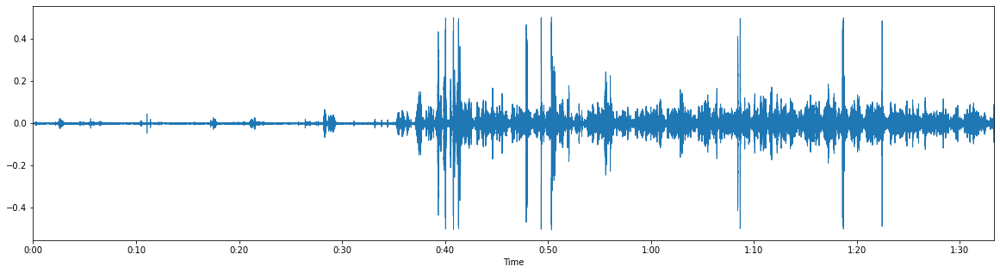

In [8]:
%matplotlib inline
import sklearn
import matplotlib.pyplot as plt
import librosa.display

plt.figure(figsize=(20, 5))
librosa.display.waveplot(x, sr=sr)

In [9]:
x

array([-2.1376502e-06,  1.9433005e-06, -1.6093279e-06, ...,
       -7.0213944e-02, -7.9579324e-02,  0.0000000e+00], dtype=float32)

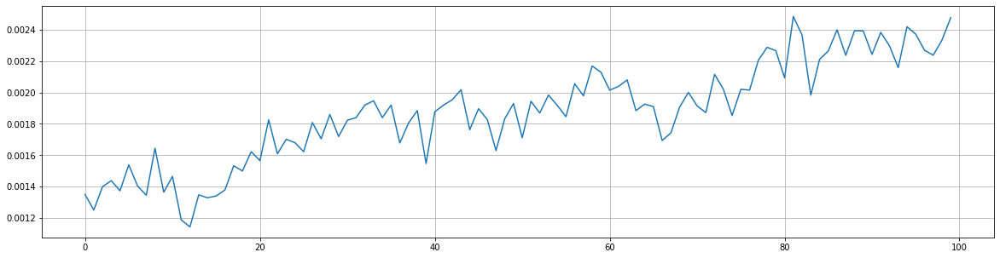

In [10]:
n0 = 9000
n1 = 9100
plt.figure(figsize=(20, 5))
plt.plot(x[n0:n1])
plt.grid()

In [11]:
zero_crossings = librosa.zero_crossings(x[n0:n1], pad=False)
zero_crossings.shape

(100,)

In [12]:
print(sum(zero_crossings))

0


In [13]:
spectral_centroids = librosa.feature.spectral_centroid(x, sr=sr)[0]
spectral_centroids.shape

(4021,)

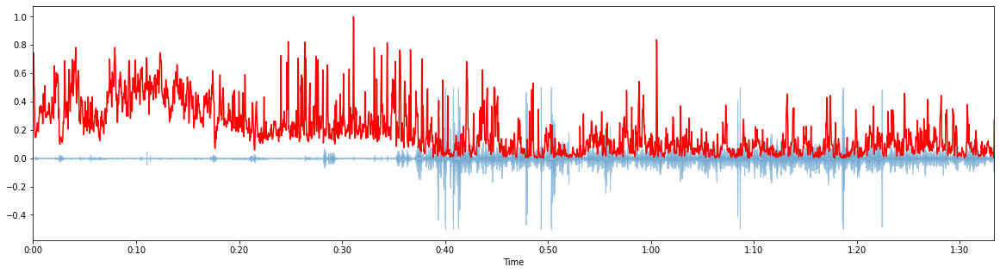

In [14]:
# Computing the time variable for visualization
plt.figure(figsize=(20,5))
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)

# Normalising the spectral centroid for visualisation
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

#Plotting the Spectral Centroid along the waveform
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r')

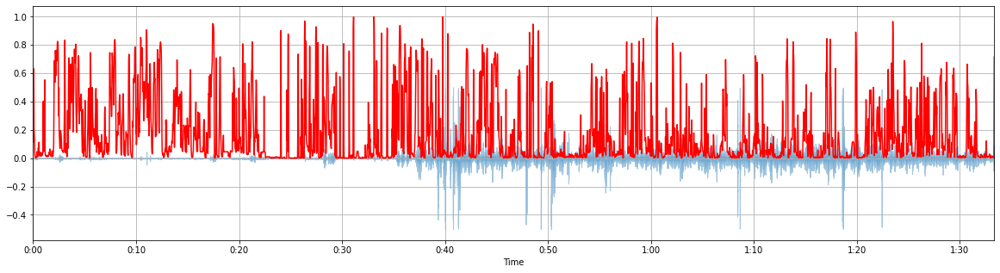

In [15]:
plt.figure(figsize=(20,5))
spectral_rolloff = librosa.feature.spectral_rolloff(x+0.01, sr=sr)[0]
librosa.display.waveplot(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_rolloff), color='r')
plt.grid()

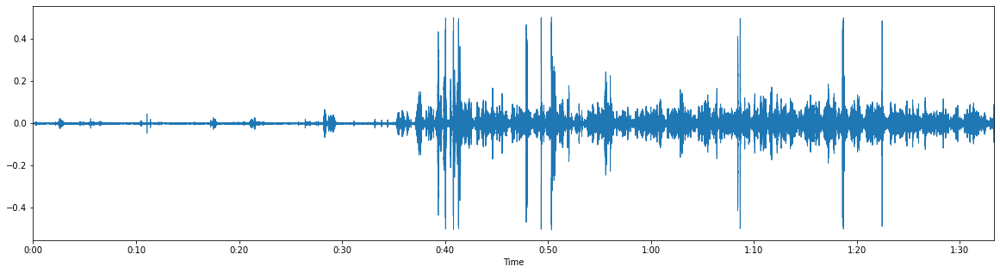

In [16]:
# MFCC - Mel-frequency cepstral coefficients (MFCCs) are coefficients that collectively make up an MFC.
# They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum").

plt.figure(figsize=(20,5))
x, fs = librosa.load('26-29_09_2017_KCL/ReadText/PD/ID13_pd_3_2_2.wav')
librosa.display.waveplot(x, sr=sr)

(20, 4021)


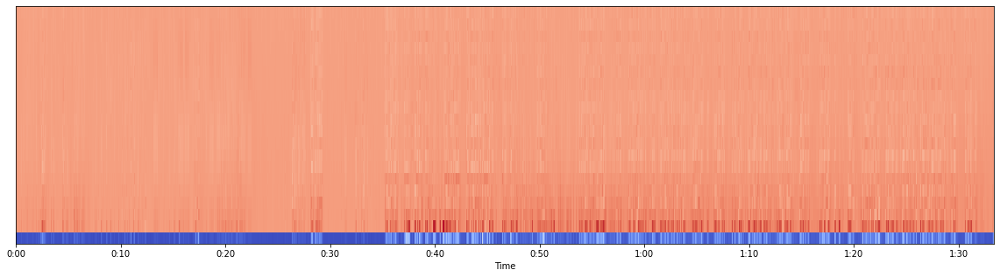

In [17]:
# MFCC
plt.figure(figsize=(20,5))
mfccs = librosa.feature.mfcc(x, sr=sr)
print(mfccs.shape)

librosa.display.specshow(mfccs, sr=sr, x_axis='time')

In [18]:
# Feature Scaling: Scaling the MFCCs such that each coefficient dimension has zero mean and unit variance.
mfccs = sklearn.preprocessing.scale(mfccs, axis=1)
print(mfccs.mean(axis=1))
print(mfccs.var(axis=1))

[ 0.0000000e+00  0.0000000e+00  0.0000000e+00 -1.5179099e-08
  0.0000000e+00  3.0358198e-08 -1.5179099e-08 -1.8973874e-09
  0.0000000e+00  0.0000000e+00  7.5895494e-09  5.6921619e-09
  0.0000000e+00  0.0000000e+00  0.0000000e+00  0.0000000e+00
 -3.7947747e-09 -7.5895494e-09 -9.4869366e-09 -3.7947747e-09]
[1.         1.         0.9999999  1.         1.0000002  1.0000001
 1.         0.99999994 1.         1.         1.         1.
 0.99999994 1.0000001  0.9999999  1.0000002  1.0000001  1.
 1.         1.        ]


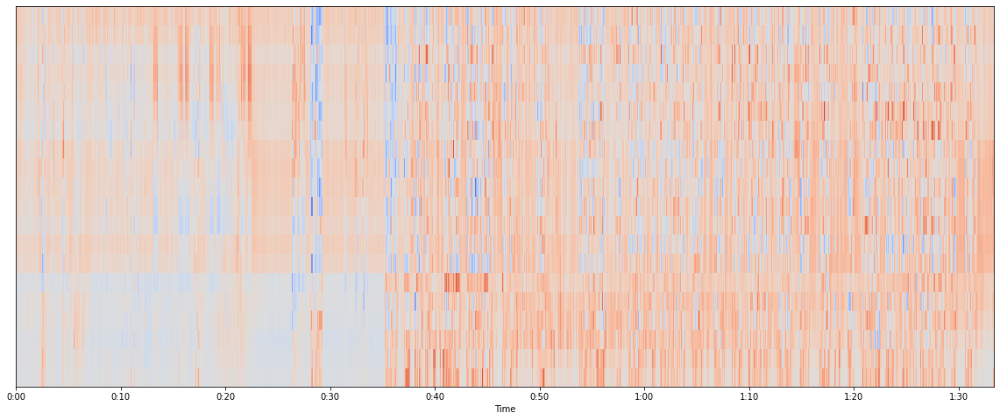

In [19]:
plt.figure(figsize=(20,8))
librosa.display.specshow(mfccs, sr=sr, x_axis='time')

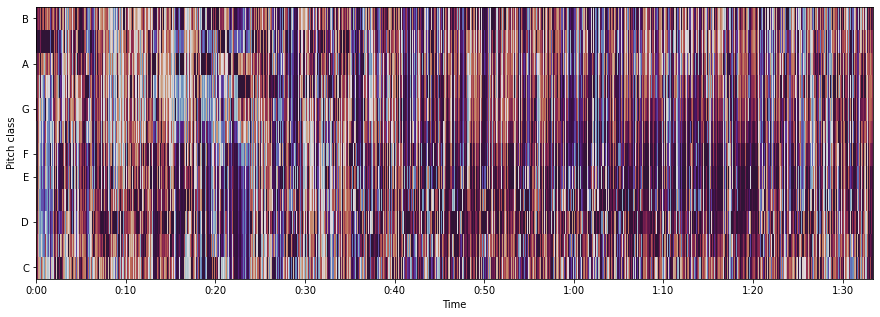

In [21]:
hop_length = 512
chromagram = librosa.feature.chroma_stft(x, sr=sr, hop_length=hop_length)
plt.figure(figsize=(15, 5))
librosa.display.specshow(chromagram, x_axis='time', y_axis='chroma', hop_length=hop_length, cmap='twilight_shifted')


## Classification using data taken from >>> **http://archive.ics.uci.edu/ml/datasets/Parkinsons**

In [22]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.metrics import confusion_matrix
%matplotlib inline
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import metrics

In [24]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.preprocessing import StandardScaler

from sklearn.preprocessing import LabelEncoder,OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import AdaBoostClassifier
from xgboost import XGBClassifier

In [30]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [31]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/gdrive/My Drive/Kaggle2"

In [32]:
%cd /content/gdrive/My Drive/Kaggle2

/content/gdrive/My Drive/Kaggle2


In [39]:
!kaggle datasets download -d nidaguler/parkinsons-data-set

  0% 0.00/17.1k [00:00<?, ?B/s]
100% 17.1k/17.1k [00:00<00:00, 4.08MB/s]


In [40]:
!unzip \*.zip  && rm *.zip

Archive:  parkinsons-data-set.zip
  inflating: parkinsons.data         
  inflating: parkinsons.names        


In [42]:
df = pd.read_csv('parkinsons.data')

In [43]:
df.head()

,name,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter(%),MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,MDVP:APQ,Shimmer:DDA,NHR,HNR,status,RPDE,DFA,spread1,spread2,D2,PPE
0,phon_R01_S01_1,119.992,157.302,74.997,0.00784,0.00007,0.00370,0.00554,0.01109,0.04374,0.426,0.02182,0.03130,0.02971,0.06545,0.02211,21.033,1,0.414783,0.815285,-4.813031,0.266482,2.301442,0.284654
1,phon_R01_S01_2,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,0.03134,0.04518,0.04368,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
2,phon_R01_S01_3,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,0.02757,0.03858,0.03590,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
3,phon_R01_S01_4,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,0.02924,0.04005,0.03772,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
4,phon_R01_S01_5,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,0.03490,0.04825,0.04465,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335


In [44]:
df1 = df.drop('name',axis = 1)

In [46]:
from sklearn.model_selection import train_test_split

In [48]:
X = df1[df1.columns.difference(['status'])]
y = df1['status']

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [50]:
model = RandomForestClassifier()
model.fit(X_train, y_train)


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [52]:
y_pred = model.predict(X_test)

In [53]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.9333333333333333